# Bias correction of numerical prediction model temperature forecast 

In [56]:
#data analysis and wrangling
import pandas as pd
import numpy as np

#visualizing the data
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn import preprocessing

#model developing-machine learning
import sklearn
from scipy.stats import zscore                                                          #for removing the outliers
from sklearn.preprocessing import StandardScaler                                        #for standardizing the input dataset
from sklearn.model_selection import train_test_split                                    #to train the model
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor

from sklearn.model_selection import cross_val_score
from sklearn.metrics import r2_score,mean_squared_error                                 #for reporting purposes

#boosting techniques
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier, ExtraTreesClassifier

#saving the model using joblib
import pickle
#for filtering the warnings
import warnings
warnings.filterwarnings("ignore")

In [14]:
#acquiring the train data
Bias_df=pd.read_excel("C:/Users/Subhajit Roy/Desktop/Bias_correction_ucl.xlsx")

In [15]:
print(Bias_df.shape)

(7752, 25)


In [16]:
Bias_df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [17]:
Bias_df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7750.000000,7682.000000,7682.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,...,7677.000000,7677.000000,7677.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7725.000000,7725.000000
mean,13.000000,29.768211,23.225059,56.759372,88.374804,29.613447,23.512589,7.097875,62.505019,0.368774,...,0.485003,0.278200,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220
std,7.211568,2.969999,2.413961,14.668111,7.192004,2.947191,2.345347,2.183836,33.730589,0.262458,...,1.762807,1.161809,1.206214,0.050352,0.079435,54.279780,1.370444,429.158867,3.128010,2.487613
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000
25%,7.000000,27.800000,21.700000,45.963543,84.222862,27.673499,22.089739,5.678705,37.266753,0.146654,...,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.300000
50%,13.000000,29.900000,23.400000,55.039024,89.793480,29.703426,23.760199,6.547470,56.865482,0.315697,...,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000
75%,19.000000,32.000000,24.900000,67.190056,93.743629,31.710450,25.152909,8.032276,84.223616,0.575489,...,0.018364,0.007896,0.000041,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000


In [18]:
Bias_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   station           7750 non-null   float64       
 1   Date              7750 non-null   datetime64[ns]
 2   Present_Tmax      7682 non-null   float64       
 3   Present_Tmin      7682 non-null   float64       
 4   LDAPS_RHmin       7677 non-null   float64       
 5   LDAPS_RHmax       7677 non-null   float64       
 6   LDAPS_Tmax_lapse  7677 non-null   float64       
 7   LDAPS_Tmin_lapse  7677 non-null   float64       
 8   LDAPS_WS          7677 non-null   float64       
 9   LDAPS_LH          7677 non-null   float64       
 10  LDAPS_CC1         7677 non-null   float64       
 11  LDAPS_CC2         7677 non-null   float64       
 12  LDAPS_CC3         7677 non-null   float64       
 13  LDAPS_CC4         7677 non-null   float64       
 14  LDAPS_PPT1        7677 n

In [19]:
Bias_df["Day"] = pd.to_datetime(Bias_df.Date, format="%Y-%m-%d").dt.day
Bias_df["Month"] = pd.to_datetime(Bias_df.Date, format = "%Y-%m-%d").dt.month
Bias_df["Year"] = pd.to_datetime(Bias_df.Date, format = "%Y-%m-%d").dt.year

In [20]:
Bias_df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2,30.0,6.0,2013.0
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5,30.0,6.0,2013.0
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9,30.0,6.0,2013.0
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3,30.0,6.0,2013.0
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5,30.0,6.0,2013.0


In [21]:
Bias_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 28 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   station           7750 non-null   float64       
 1   Date              7750 non-null   datetime64[ns]
 2   Present_Tmax      7682 non-null   float64       
 3   Present_Tmin      7682 non-null   float64       
 4   LDAPS_RHmin       7677 non-null   float64       
 5   LDAPS_RHmax       7677 non-null   float64       
 6   LDAPS_Tmax_lapse  7677 non-null   float64       
 7   LDAPS_Tmin_lapse  7677 non-null   float64       
 8   LDAPS_WS          7677 non-null   float64       
 9   LDAPS_LH          7677 non-null   float64       
 10  LDAPS_CC1         7677 non-null   float64       
 11  LDAPS_CC2         7677 non-null   float64       
 12  LDAPS_CC3         7677 non-null   float64       
 13  LDAPS_CC4         7677 non-null   float64       
 14  LDAPS_PPT1        7677 n

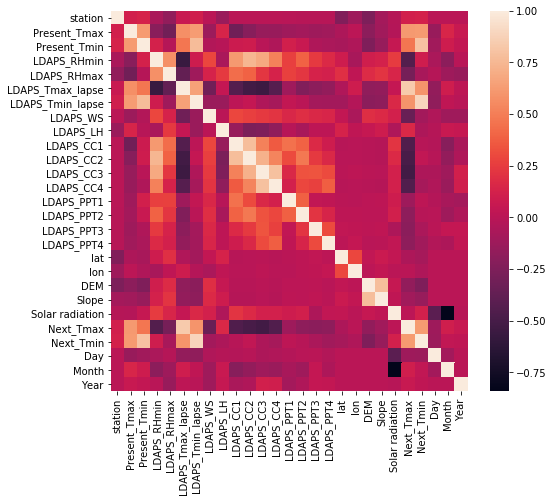

In [27]:
#checking for the correlation
corr_hmap=Bias_df.corr()
plt.figure(figsize=(8,7))
sns.heatmap(corr_hmap)

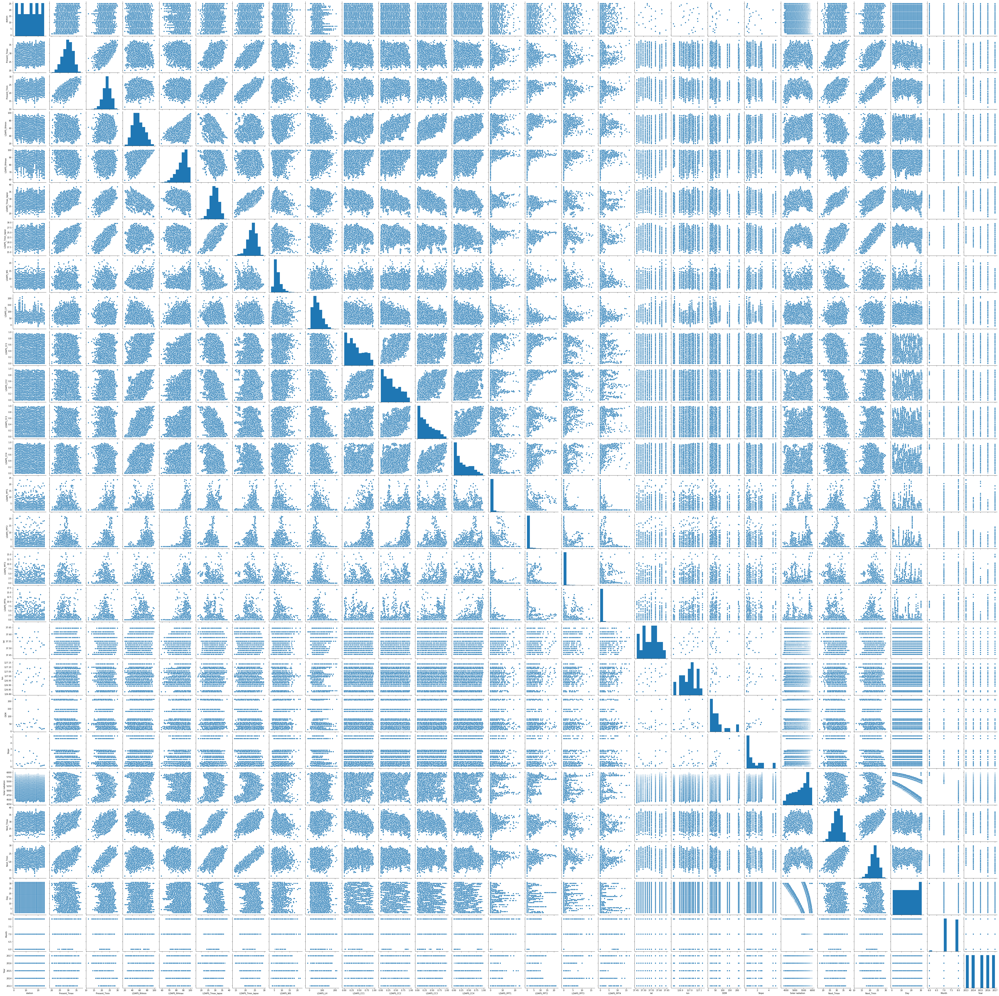

In [28]:
sns.pairplot(Bias_df)

In [29]:
Bias_df.isnull().sum()

station              2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
Day                  2
Month                2
Year                 2
dtype: int64

In [31]:
#imputer functions(handling null values)
Bias_df['Present_Tmax'].fillna(Bias_df['Present_Tmax'].mean(),inplace=True)
Bias_df['Present_Tmin'].fillna(Bias_df['Present_Tmin'].mean(),inplace=True)
Bias_df['LDAPS_RHmin'].fillna(Bias_df['LDAPS_RHmin'].mean(),inplace=True)
Bias_df['LDAPS_RHmax'].fillna(Bias_df['LDAPS_RHmax'].mean(),inplace=True)
Bias_df['LDAPS_Tmax_lapse'].fillna(Bias_df['LDAPS_Tmax_lapse'].mean(),inplace=True)
Bias_df['LDAPS_Tmin_lapse'].fillna(Bias_df['LDAPS_Tmin_lapse'].mean(),inplace=True)
Bias_df['LDAPS_WS'].fillna(Bias_df['LDAPS_WS'].mean(),inplace=True)
Bias_df['LDAPS_LH'].fillna(Bias_df['LDAPS_LH'].mean(),inplace=True)
Bias_df['LDAPS_CC1'].fillna(Bias_df['LDAPS_CC1'].mean(),inplace=True)
Bias_df['LDAPS_CC2'].fillna(Bias_df['LDAPS_CC2'].mean(),inplace=True)
Bias_df['LDAPS_CC3'].fillna(Bias_df['LDAPS_CC3'].mean(),inplace=True)
Bias_df['LDAPS_CC4'].fillna(Bias_df['LDAPS_CC4'].mean(),inplace=True)
Bias_df['LDAPS_PPT1'].fillna(Bias_df['LDAPS_PPT1'].mean(),inplace=True)
Bias_df['LDAPS_PPT2'].fillna(Bias_df['LDAPS_PPT2'].mean(),inplace=True)
Bias_df['LDAPS_PPT3'].fillna(Bias_df['LDAPS_PPT3'].mean(),inplace=True)
Bias_df['LDAPS_PPT4'].fillna(Bias_df['LDAPS_PPT4'].mean(),inplace=True)
Bias_df['Next_Tmax'].fillna(Bias_df['Next_Tmax'].mean(),inplace=True)
Bias_df['Next_Tmin'].fillna(Bias_df['Next_Tmin'].mean(),inplace=True)

<bound method Series.dropna of 0       2013.0
1       2013.0
2       2013.0
3       2013.0
4       2013.0
         ...  
7747    2017.0
7748    2017.0
7749    2017.0
7750       NaN
7751       NaN
Name: Year, Length: 7752, dtype: float64>

In [ ]:
Bias_df.dropna(inplace=True)

In [37]:
Bias_df.isnull().sum()

station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
Day                 0
Month               0
Year                0
dtype: int64

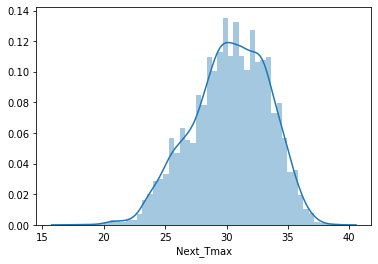

In [38]:
sns.distplot(Bias_df['Next_Tmax'])

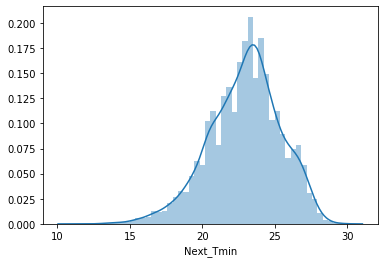

In [39]:
sns.distplot(Bias_df['Next_Tmin'])

station                AxesSubplot(0.125,0.799681;0.168478x0.0803191)
Present_Tmax        AxesSubplot(0.327174,0.799681;0.168478x0.0803191)
Present_Tmin        AxesSubplot(0.529348,0.799681;0.168478x0.0803191)
LDAPS_RHmin         AxesSubplot(0.731522,0.799681;0.168478x0.0803191)
LDAPS_RHmax            AxesSubplot(0.125,0.703298;0.168478x0.0803191)
LDAPS_Tmax_lapse    AxesSubplot(0.327174,0.703298;0.168478x0.0803191)
LDAPS_Tmin_lapse    AxesSubplot(0.529348,0.703298;0.168478x0.0803191)
LDAPS_WS            AxesSubplot(0.731522,0.703298;0.168478x0.0803191)
LDAPS_LH               AxesSubplot(0.125,0.606915;0.168478x0.0803191)
LDAPS_CC1           AxesSubplot(0.327174,0.606915;0.168478x0.0803191)
LDAPS_CC2           AxesSubplot(0.529348,0.606915;0.168478x0.0803191)
LDAPS_CC3           AxesSubplot(0.731522,0.606915;0.168478x0.0803191)
LDAPS_CC4              AxesSubplot(0.125,0.510532;0.168478x0.0803191)
LDAPS_PPT1          AxesSubplot(0.327174,0.510532;0.168478x0.0803191)
LDAPS_PPT2          

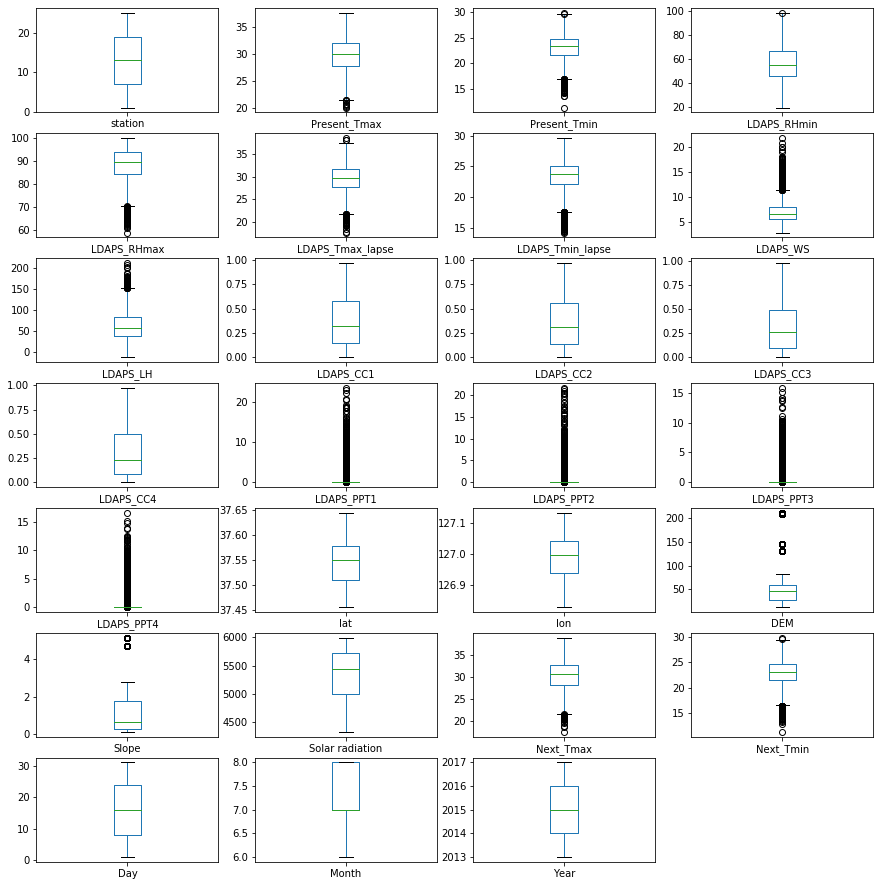

In [41]:
#checking for the outliers
Bias_df.plot(kind='box',subplots=True,layout=(8,4),figsize=(15,18))

In [42]:
#removing outliers
z_score=np.abs(zscore(Bias_df))
print(Bias_df.shape)
Bias_df_final=Bias_df.loc[(z_score<3).all(axis=1)]
print(Bias_df_final.shape)

(7750, 27)
(6888, 27)


In [44]:
#Now separating input and output variable
x=Bias_df_final.drop(['Next_Tmax','Next_Tmin'],axis=1)
y=Bias_df_final['Next_Tmax']
print(x.shape)
print(y.shape)

(6888, 25)
(6888,)


In [45]:
#Now separating input and output variable
x1=Bias_df_final.drop(['Next_Tmax','Next_Tmin'],axis=1)
y1=Bias_df_final['Next_Tmin']
print(x.shape)
print(y.shape)

(6888, 25)
(6888,)


In [47]:
#standardizing the input dataset 
sc=StandardScaler()
x=sc.fit_transform(x)
print(x)
print("---------------------------------------------------------------------------")

#standardizing the input dataset 
sc=StandardScaler()
x1=sc.fit_transform(x1)
print(x1)

[[-1.67163974 -0.43422888 -0.82831333 ...  1.58041054 -2.79911673
  -1.42333046]
 [-1.5327565   0.68720923 -0.74163313 ...  1.58041054 -2.79911673
  -1.42333046]
 [-1.39387325  0.58207441 -0.00485146 ...  1.58041054 -2.79911673
  -1.42333046]
 ...
 [ 1.38379171 -2.32665569 -2.69193755 ...  1.58041054  0.99510073
   1.43411641]
 [ 1.52267496 -2.32665569 -2.43189696 ...  1.58041054  0.99510073
   1.43411641]
 [ 1.66155821 -2.36170063 -2.56191726 ...  1.58041054  0.99510073
   1.43411641]]
---------------------------------------------------------------------------
[[-1.67163974 -0.43422888 -0.82831333 ...  1.58041054 -2.79911673
  -1.42333046]
 [-1.5327565   0.68720923 -0.74163313 ...  1.58041054 -2.79911673
  -1.42333046]
 [-1.39387325  0.58207441 -0.00485146 ...  1.58041054 -2.79911673
  -1.42333046]
 ...
 [ 1.38379171 -2.32665569 -2.69193755 ...  1.58041054  0.99510073
   1.43411641]
 [ 1.52267496 -2.32665569 -2.43189696 ...  1.58041054  0.99510073
   1.43411641]
 [ 1.66155821 -2.36170

In [57]:
#Machine Learning Models
models=[]
models.append(('LR', LinearRegression()))
models.append(('reg_rf', RandomForestRegressor()))

In [58]:
r2_scr_results = []
names = []
for name, model in models:
    print(name)
    max_r2_score=0
    for r_state in range(42,100):
        x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=r_state,test_size=0.10)
        model_name=model
        model_name.fit(x_train,y_train)
        y_pred=model_name.predict(x_test)
        r2_scr=r2_score(y_test,y_pred)
        print("random state: ",r_state," accuracy score: ",r2_scr)
        if r2_scr>max_r2_score:
            max_r2_score=r2_scr      
            final_r_state=r_state
    r2_scr_results.append(max_r2_score*100)
    print()
    print("max accuracy score at random state:",final_r_state," for the model ",name," is: ",max_r2_score)
    print()
    print()

LR
random state:  42  accuracy score:  0.7432772580321751
random state:  43  accuracy score:  0.7619347085321612
random state:  44  accuracy score:  0.747821281083596
random state:  45  accuracy score:  0.7546061847834808
random state:  46  accuracy score:  0.7695848161042291
random state:  47  accuracy score:  0.7638879180065428
random state:  48  accuracy score:  0.7266137162366906
random state:  49  accuracy score:  0.7552238376931214
random state:  50  accuracy score:  0.7599295581275607
random state:  51  accuracy score:  0.7611469899168075
random state:  52  accuracy score:  0.7413870893176953
random state:  53  accuracy score:  0.7130062964563546
random state:  54  accuracy score:  0.7165282324765081
random state:  55  accuracy score:  0.744211523391915
random state:  56  accuracy score:  0.7716628432139291
random state:  57  accuracy score:  0.7279938099148636
random state:  58  accuracy score:  0.7468466659751598
random state:  59  accuracy score:  0.7558649349860558
random st

In [59]:
#cross_val of the models
results = []
names = []
cvs=[]
for name, model in models:
    cv_result=cross_val_score(model, x_train, y_train, cv=2, scoring="r2")
    results.append(cv_result)
    names.append(name)
    print("Model name: ",name)
    print("Cross Validation Score(Mean): ",cv_result.mean())
    cvs.append(cv_result.mean()*100)
    print("Cross Validation Score(Std): ",cv_result.std())
    print()

Model name:  LR
Cross Validation Score(Mean):  0.7492570164789205
Cross Validation Score(Std):  0.005983987090888709

Model name:  reg_rf
Cross Validation Score(Mean):  0.86994573774243
Cross Validation Score(Std):  0.007386420758497436



In [60]:
#checking for the best results
result=pd.DataFrame({'Model':models,'Accuracy_Score':r2_scr_results, 'Cross_Validation_Score':cvs})
result

,Model,Accuracy_Score,Cross_Validation_Score
0,"(LR, LinearRegression(copy_X=True, fit_interce...",78.206985,74.925702
1,"(reg_rf, (DecisionTreeRegressor(ccp_alpha=0.0,...",91.621108,86.994574


In [61]:
#Choosing the Best Model
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=67,test_size=0.10)
model_name=RandomForestRegressor()
model_name.fit(x_train,y_train)
y_pred_model=model_name.predict(x_test)
r2_scr=r2_score(y_test,y_pred)
mse=mean_squared_error(y_test,y_pred)
print("r2 score: ",r2_scr)
print("mean squared error: ",mse)
print(y_pred_model)

r2 score:  -0.8272459575939837
mean squared error:  16.397418775207274
[33.379      32.05274887 31.86473981 32.1062466  26.99174434 36.504
 33.30674887 27.471      31.09674887 27.653      28.997      32.298
 32.298      32.708      30.403      32.674      33.544      33.374
 32.358      28.482      26.555      27.95374887 36.077      28.948
 29.035      33.619      32.108      28.38174887 33.688      31.701
 29.513      30.54249773 34.8        33.636      30.637      32.406
 24.398      32.08       29.839      29.992      33.114      24.89
 31.526      31.434      27.20073981 32.235      30.379      29.705
 31.93       34.735      25.899      28.2        32.674      30.76574887
 30.33174887 27.968      33.629      32.892      35.234      30.11274887
 28.732      30.989      26.192      24.58       26.319      29.395
 27.48749773 31.024      31.62699547 31.6762466  30.003      28.611
 31.667      35.35       30.453      28.773      31.83       30.061
 31.44574887 32.79674887 35.08      

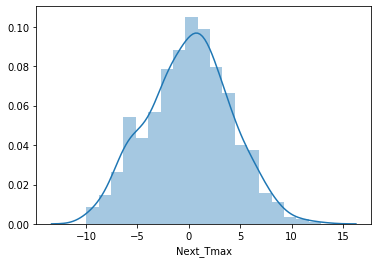

In [63]:
sns.distplot(y_test-y_pred)
plt.show()

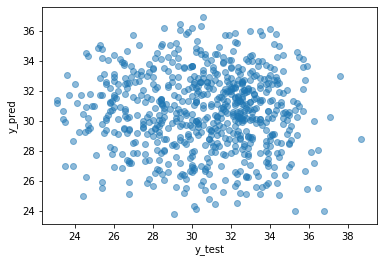

In [64]:
plt.scatter(y_test, y_pred, alpha = 0.5)
plt.xlabel("y_test")
plt.ylabel("y_pred")
plt.show()

In [67]:
#saving the model as pickle in a file
pickle.dump(model_name,open('RF_bias_correction_data.pkl','wb'))

In [68]:
#loading the model for testing
loaded_model=pickle.load(open('RF_bias_correction_data.pkl','rb'))
loaded_model.predict(x_test)

array([33.379     , 32.05274887, 31.86473981, 32.1062466 , 26.99174434,
       36.504     , 33.30674887, 27.471     , 31.09674887, 27.653     ,
       28.997     , 32.298     , 32.298     , 32.708     , 30.403     ,
       32.674     , 33.544     , 33.374     , 32.358     , 28.482     ,
       26.555     , 27.95374887, 36.077     , 28.948     , 29.035     ,
       33.619     , 32.108     , 28.38174887, 33.688     , 31.701     ,
       29.513     , 30.54249773, 34.8       , 33.636     , 30.637     ,
       32.406     , 24.398     , 32.08      , 29.839     , 29.992     ,
       33.114     , 24.89      , 31.526     , 31.434     , 27.20073981,
       32.235     , 30.379     , 29.705     , 31.93      , 34.735     ,
       25.899     , 28.2       , 32.674     , 30.76574887, 30.33174887,
       27.968     , 33.629     , 32.892     , 35.234     , 30.11274887,
       28.732     , 30.989     , 26.192     , 24.58      , 26.319     ,
       29.395     , 27.48749773, 31.024     , 31.62699547, 31.67

In [69]:
#Machine Learning Models
models=[]
models.append(('LR', LinearRegression()))
models.append(('reg_rf', RandomForestRegressor()))

In [71]:
r2_scr_results = []
names = []
for name, model in models:
    print(name)
    max_r2_score=0
    for r_state in range(42,100):
        x1_train,x1_test,y1_train,y1_test=train_test_split(x1,y1,random_state=r_state,test_size=0.10)
        model_name=model
        model_name.fit(x1_train,y1_train)
        y1_pred=model_name.predict(x1_test)
        r2_scr=r2_score(y1_test,y1_pred)
        print("random state: ",r_state," accuracy score: ",r2_scr)
        if r2_scr>max_r2_score:
            max_r2_score=r2_scr      
            final_r_state=r_state
    r2_scr_results.append(max_r2_score*100)
    print()
    print("max accuracy score at random state:",final_r_state," for the model ",name," is: ",max_r2_score)
    print()
    print()

LR
random state:  42  accuracy score:  0.8226978123500618
random state:  43  accuracy score:  0.8219412482052115
random state:  44  accuracy score:  0.805524031528168
random state:  45  accuracy score:  0.8103276292767586
random state:  46  accuracy score:  0.8174367551102484
random state:  47  accuracy score:  0.8215473513362965
random state:  48  accuracy score:  0.8189655602292064
random state:  49  accuracy score:  0.8273957223687225
random state:  50  accuracy score:  0.8314260818909642
random state:  51  accuracy score:  0.8192128848610366
random state:  52  accuracy score:  0.8346818800197904
random state:  53  accuracy score:  0.7830653295585301
random state:  54  accuracy score:  0.8135198824159141
random state:  55  accuracy score:  0.818319441572149
random state:  56  accuracy score:  0.798289067823998
random state:  57  accuracy score:  0.8290859778502354
random state:  58  accuracy score:  0.811639605075789
random state:  59  accuracy score:  0.8324017264178246
random stat

In [72]:
#cross_val of the models
results = []
names = []
cvs=[]
for name, model in models:
    cv_result=cross_val_score(model, x1_train, y1_train, cv=2, scoring="r2")
    results.append(cv_result)
    names.append(name)
    print("Model name: ",name)
    print("Cross Validation Score(Mean): ",cv_result.mean())
    cvs.append(cv_result.mean()*100)
    print("Cross Validation Score(Std): ",cv_result.std())
    print()

Model name:  LR
Cross Validation Score(Mean):  0.8153865678947292
Cross Validation Score(Std):  0.002512236492358322

Model name:  reg_rf
Cross Validation Score(Mean):  0.8806743639554284
Cross Validation Score(Std):  0.006383938723550031



In [73]:
#checking for the best results
result=pd.DataFrame({'Model':models,'Accuracy_Score':r2_scr_results, 'Cross_Validation_Score':cvs})
result

,Model,Accuracy_Score,Cross_Validation_Score
0,"(LR, LinearRegression(copy_X=True, fit_interce...",83.851490,81.538657
1,"(reg_rf, (DecisionTreeRegressor(ccp_alpha=0.0,...",91.471859,88.067436


In [74]:
#Choosing the Best Model
x1_train,x1_test,y1_train,y1_test=train_test_split(x1,y1,random_state=52,test_size=0.10)
model_name=RandomForestRegressor()
model_name.fit(x1_train,y1_train)
y1_pred_model=model_name.predict(x1_test)
r2_scr=r2_score(y1_test,y1_pred)
mse=mean_squared_error(y1_test,y1_pred)
print("r2 score: ",r2_scr)
print("mean squared error: ",mse)
print(y1_pred_model)

r2 score:  -0.8912131376767618
mean squared error:  11.016528137545993
[23.875      23.7203222  21.06       21.444      26.756      23.117
 21.382      24.931      24.611      22.825      22.785      23.578
 20.304      23.627      25.115      23.391      24.757      23.212
 21.01       24.665      22.119      23.77       26.533      23.7599332
 26.185      22.634      25.0136444  20.304      23.9643222  23.825
 24.316      24.863      21.09       24.499      27.468      23.58
 24.171      22.73       24.172      22.03       24.842      24.8023222
 24.15       24.686      19.429      23.097      27.126      23.19
 22.323      20.883      22.7063222  20.303      26.091      23.221
 23.272      23.908      25.38       23.737      25.723      22.2153222
 18.923      21.8313222  22.596      19.272      22.2763222  19.85
 20.607      25.126      24.95       22.7383222  22.9559666  24.529
 22.164      19.868      25.5116444  20.469      22.591      22.87
 24.594      19.3013222  24.607      

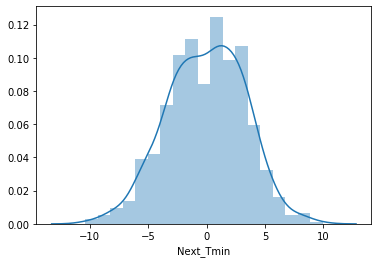

In [75]:
sns.distplot(y1_test-y1_pred)
plt.show()

In [76]:
#saving the model as pickle in a file
pickle.dump(model_name,open('RF_bias_correction_data1.pkl','wb'))

In [77]:
#loading the model for testing
loaded_model=pickle.load(open('RF_bias_correction_data1.pkl','rb'))
loaded_model.predict(x_test)

array([23.785     , 23.934     , 26.5076444 , 26.1126444 , 22.407     ,
       26.9       , 25.393     , 22.802     , 23.469     , 16.815     ,
       21.248     , 26.886     , 26.356     , 21.56      , 21.944     ,
       25.866     , 22.925     , 25.909     , 22.543     , 24.57      ,
       23.4426444 , 21.936     , 27.131     , 20.649     , 23.975     ,
       23.441     , 21.536     , 24.061     , 23.2263222 , 23.918     ,
       21.578     , 21.336     , 26.169     , 26.673     , 22.063     ,
       19.512     , 20.083     , 20.693     , 23.816     , 24.557     ,
       24.093     , 20.273     , 19.627     , 20.883     , 22.393     ,
       21.9       , 24.205     , 19.779     , 21.532     , 24.7266444 ,
       20.215     , 20.556     , 22.078     , 21.821     , 23.071     ,
       20.827     , 24.045     , 26.809     , 24.846     , 19.682     ,
       19.29      , 24.4103222 , 20.174     , 20.992     , 22.348     ,
       24.088     , 20.431     , 21.441     , 25.1923222 , 23.98